
### Data fields
<p> 
Columns along with their descriptions:

1. `subject#`: Identifier for the subject/participant in the study.
   
2. `age`: Age of the subject at the time of the assessment.

3. `sex`: Gender of the subject (e.g., Male or Female).

4. `test_time`: Time of the test in seconds. It may indicate the duration since some reference point (e.g., start of the study).

5. `motor_UPDRS`: Motor Unified Parkinson's Disease Rating Scale. This is a clinical rating scale used to assess the severity of Parkinson's disease-related motor impairments.

6. `total_UPDRS`: Total Unified Parkinson's Disease Rating Scale. Similar to `motor_UPDRS`, but it includes both motor and non-motor symptoms of Parkinson's disease.

7. `Jitter(%)`: Percentage of jitter in the voice signal. Jitter is a measure of frequency variation in consecutive periods of a voice signal and can indicate vocal instability, which may be affected in Parkinson's disease.

8. `Jitter(Abs)`: Absolute jitter, which is a measure of absolute frequency variation in consecutive periods of a voice signal.

9. `Jitter:RAP`: Relative average perturbation. It is a measure of variation in consecutive periods of a voice signal and is related to jitter.

10. `Jitter:PPQ5`: Five-point period perturbation quotient. Another measure of frequency variation in consecutive periods of a voice signal.

11. `Jitter:DDP`: Average absolute difference of differences between consecutive periods, used to quantify jitter.

12. `Shimmer`: Amplitude variation in a voice signal. Shimmer measures the variation in amplitude between consecutive periods of a voice signal and can indicate voice instability.

13. `Shimmer(dB)`: Shimmer in decibels, which is a logarithmic measure of amplitude variation in a voice signal.

14. `Shimmer:APQ3`: Amplitude perturbation quotient calculated over three consecutive periods.

15. `Shimmer:APQ5`: Amplitude perturbation quotient calculated over five consecutive periods.

16. `Shimmer:APQ11`: Amplitude perturbation quotient calculated over eleven consecutive periods.

17. `Shimmer:DDA`: Difference between the amplitudes of consecutive periods, used to quantify shimmer.

18. `NHR`: Noise-to-harmonics ratio. A measure of the ratio of noise to harmonics in a voice signal.

19. `HNR`: Harmonics-to-noise ratio. The ratio of harmonics to noise in a voice signal.

20. `RPDE`: Recurrence period density entropy. A measure of the complexity of a time series signal.

21. `DFA`: Detrended fluctuation analysis. A measure of the self-similarity of a time series signal.

22. `PPE`: Pitch period entropy. A measure of the variability of pitch periods in a voice signal.

</P>

Parameters such as Jitter(%), Jitter(Abs), Jitter:RAP, Jitter:PPQ5, Jitter:DDP, Shimmer, Shimmer(dB), Shimmer:APQ3, Shimmer:APQ5, Shimmer:APQ11, and Shimmer:DDA, as well as NHR and HNR, are typically derived from voice recordings. These parameters are calculated using specialized algorithms and software that analyze the voice recordings to measure various aspects of the voice signal such as frequency and amplitude variations, noise-to-harmonics ratio, and other characteristics.

## Reading the dataset

In [174]:
import pandas as pd
df = pd.read_csv('parkinsons_updrs.csv')

df.head()
X = df.drop(columns = ['subject#', 'motor_UPDRS', 'total_UPDRS'])
y = df['motor_UPDRS']
df.head(10)

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,...,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,...,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,...,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,...,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,...,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
5,1,72,0,40.6520,29.435,36.870,0.00353,0.000023,0.00119,0.00159,...,0.214,0.01006,0.01337,0.02263,0.03019,0.009438,22.946,0.53949,0.57243,0.19500
6,1,72,0,47.6490,29.682,37.363,0.00422,0.000024,0.00212,0.00221,...,0.445,0.02376,0.02621,0.03488,0.07128,0.013260,22.506,0.49250,0.54779,0.17563
7,1,72,0,54.6400,29.928,37.857,0.00476,0.000025,0.00226,0.00259,...,0.212,0.00979,0.01462,0.01911,0.02937,0.027969,22.929,0.47712,0.54234,0.23844
8,1,72,0,61.6690,30.177,38.353,0.00432,0.000029,0.00156,0.00207,...,0.371,0.01774,0.02134,0.03451,0.05323,0.013381,22.078,0.51563,0.61864,0.20037
9,1,72,0,68.6880,30.424,38.849,0.00496,0.000027,0.00258,0.00253,...,0.310,0.02030,0.01970,0.02569,0.06089,0.018021,22.606,0.50032,0.58673,0.20117


# 1. EDA
## 1.1 Data Summary

In [175]:
print("Columns: " , df.columns)
print("Dimension: ", df.ndim)
print("Size: ", df.size)
print("Shape: ", df.shape)

Columns:  Index(['subject#', 'age', 'sex', 'test_time', 'motor_UPDRS', 'total_UPDRS',
       'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5', 'Jitter:DDP',
       'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'PPE'],
      dtype='object')
Dimension:  2
Size:  129250
Shape:  (5875, 22)


In [176]:
print("Unique values in features: ")
print(df['age'].unique())
print(df['subject#'].unique())
print(df['sex'].unique())
print(df['test_time'].unique())

Unique values in features: 
[72 58 57 74 75 63 73 68 55 62 65 66 67 59 60 76 49 78 36 71 56 85 61]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42]
[0 1]
[ 5.6431 12.666  19.681  ... 65.757  79.777  93.546 ]


In [177]:
print("Description: ")
df.describe()

Description: 


,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,...,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000
mean,21.494128,64.804936,0.317787,92.863722,21.296229,29.018942,0.006154,0.000044,0.002987,0.003277,...,0.310960,0.017156,0.020144,0.027481,0.051467,0.032120,21.679495,0.541473,0.653240,0.219589
std,12.372279,8.821524,0.465656,53.445602,8.129282,10.700283,0.005624,0.000036,0.003124,0.003732,...,0.230254,0.013237,0.016664,0.019986,0.039711,0.059692,4.291096,0.100986,0.070902,0.091498
min,1.000000,36.000000,0.000000,-4.262500,5.037700,7.000000,0.000830,0.000002,0.000330,0.000430,...,0.026000,0.001610,0.001940,0.002490,0.004840,0.000286,1.659000,0.151020,0.514040,0.021983
25%,10.000000,58.000000,0.000000,46.847500,15.000000,21.371000,0.003580,0.000022,0.001580,0.001820,...,0.175000,0.009280,0.010790,0.015665,0.027830,0.010955,19.406000,0.469785,0.596180,0.156340
50%,22.000000,65.000000,0.000000,91.523000,20.871000,27.576000,0.004900,0.000035,0.002250,0.002490,...,0.253000,0.013700,0.015940,0.022710,0.041110,0.018448,21.920000,0.542250,0.643600,0.205500
75%,33.000000,72.000000,1.000000,138.445000,27.596500,36.399000,0.006800,0.000053,0.003290,0.003460,...,0.365000,0.020575,0.023755,0.032715,0.061735,0.031463,24.444000,0.614045,0.711335,0.264490
max,42.000000,85.000000,1.000000,215.490000,39.511000,54.992000,0.099990,0.000446,0.057540,0.069560,...,2.107000,0.162670,0.167020,0.275460,0.488020,0.748260,37.875000,0.966080,0.865600,0.731730


In [178]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject#       5875 non-null   int64  
 1   age            5875 non-null   int64  
 2   sex            5875 non-null   int64  
 3   test_time      5875 non-null   float64
 4   motor_UPDRS    5875 non-null   float64
 5   total_UPDRS    5875 non-null   float64
 6   Jitter(%)      5875 non-null   float64
 7   Jitter(Abs)    5875 non-null   float64
 8   Jitter:RAP     5875 non-null   float64
 9   Jitter:PPQ5    5875 non-null   float64
 10  Jitter:DDP     5875 non-null   float64
 11  Shimmer        5875 non-null   float64
 12  Shimmer(dB)    5875 non-null   float64
 13  Shimmer:APQ3   5875 non-null   float64
 14  Shimmer:APQ5   5875 non-null   float64
 15  Shimmer:APQ11  5875 non-null   float64
 16  Shimmer:DDA    5875 non-null   float64
 17  NHR            5875 non-null   float64
 18  HNR     

In [179]:
df.corr()

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
subject#,1.000000,-0.030864,0.286851,-0.000882,0.252919,0.253643,0.135448,0.075156,0.120339,0.136474,...,0.142864,0.112950,0.138264,0.173333,0.112949,0.168743,-0.206929,0.147300,0.097464,0.157559
age,-0.030864,1.000000,-0.041602,0.019884,0.273665,0.310290,0.023071,0.035691,0.010255,0.013199,...,0.111130,0.098912,0.089983,0.135238,0.098913,0.007093,-0.104842,0.090208,-0.092870,0.120790
sex,0.286851,-0.041602,1.000000,-0.009805,-0.031205,-0.096559,0.051422,-0.154645,0.076718,0.087995,...,0.056481,0.044937,0.064819,0.023360,0.044938,0.168170,-0.000167,-0.159262,-0.165113,-0.099901
test_time,-0.000882,0.019884,-0.009805,1.000000,0.067918,0.075263,-0.022837,-0.011365,-0.028888,-0.023290,...,-0.030962,-0.029020,-0.036504,-0.039110,-0.029017,-0.026357,0.036545,-0.038887,0.019261,-0.000563
motor_UPDRS,0.252919,0.273665,-0.031205,0.067918,1.000000,0.947231,0.084816,0.050903,0.072684,0.076291,...,0.110076,0.084261,0.092105,0.136560,0.084260,0.074967,-0.157029,0.128607,-0.116242,0.162433
total_UPDRS,0.253643,0.310290,-0.096559,0.075263,0.947231,1.000000,0.074247,0.066927,0.064015,0.063352,...,0.098790,0.079363,0.083467,0.120838,0.079363,0.060952,-0.162117,0.156897,-0.113475,0.156195
Jitter(%),0.135448,0.023071,0.051422,-0.022837,0.084816,0.074247,1.000000,0.865577,0.984181,0.968214,...,0.716704,0.664149,0.694002,0.645965,0.664147,0.825294,-0.675188,0.427128,0.226550,0.721849
Jitter(Abs),0.075156,0.035691,-0.154645,-0.011365,0.050903,0.066927,0.865577,1.000000,0.844626,0.790538,...,0.655871,0.623830,0.621401,0.589998,0.623827,0.699960,-0.706418,0.547100,0.352264,0.787853
Jitter:RAP,0.120339,0.010255,0.076718,-0.028888,0.072684,0.064015,0.984181,0.844626,1.000000,0.947196,...,0.685551,0.650226,0.659831,0.603082,0.650225,0.792373,-0.641473,0.382891,0.214881,0.670652
Jitter:PPQ5,0.136474,0.013199,0.087995,-0.023290,0.076291,0.063352,0.968214,0.790538,0.947196,1.000000,...,0.734591,0.676711,0.734021,0.668413,0.676710,0.864864,-0.662409,0.381503,0.175359,0.663491


In [180]:
print("Checking for duplicates: ")
print(df.duplicated(subset = None, keep = "first").sum())

Checking for duplicates: 
0


In [181]:
df.isna().sum()

subject#         0
age              0
sex              0
test_time        0
motor_UPDRS      0
total_UPDRS      0
Jitter(%)        0
Jitter(Abs)      0
Jitter:RAP       0
Jitter:PPQ5      0
Jitter:DDP       0
Shimmer          0
Shimmer(dB)      0
Shimmer:APQ3     0
Shimmer:APQ5     0
Shimmer:APQ11    0
Shimmer:DDA      0
NHR              0
HNR              0
RPDE             0
DFA              0
PPE              0
dtype: int64

## 2. Data Visualization

### 2.1 Heatmap for NULL values

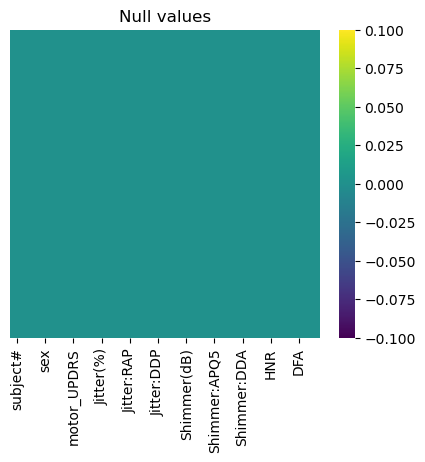

In [182]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(5,4))
sns.heatmap(df.isnull(), yticklabels = False, cmap = 'viridis')
plt.title('Null values')
plt.show()

### 2.2 Pairplots

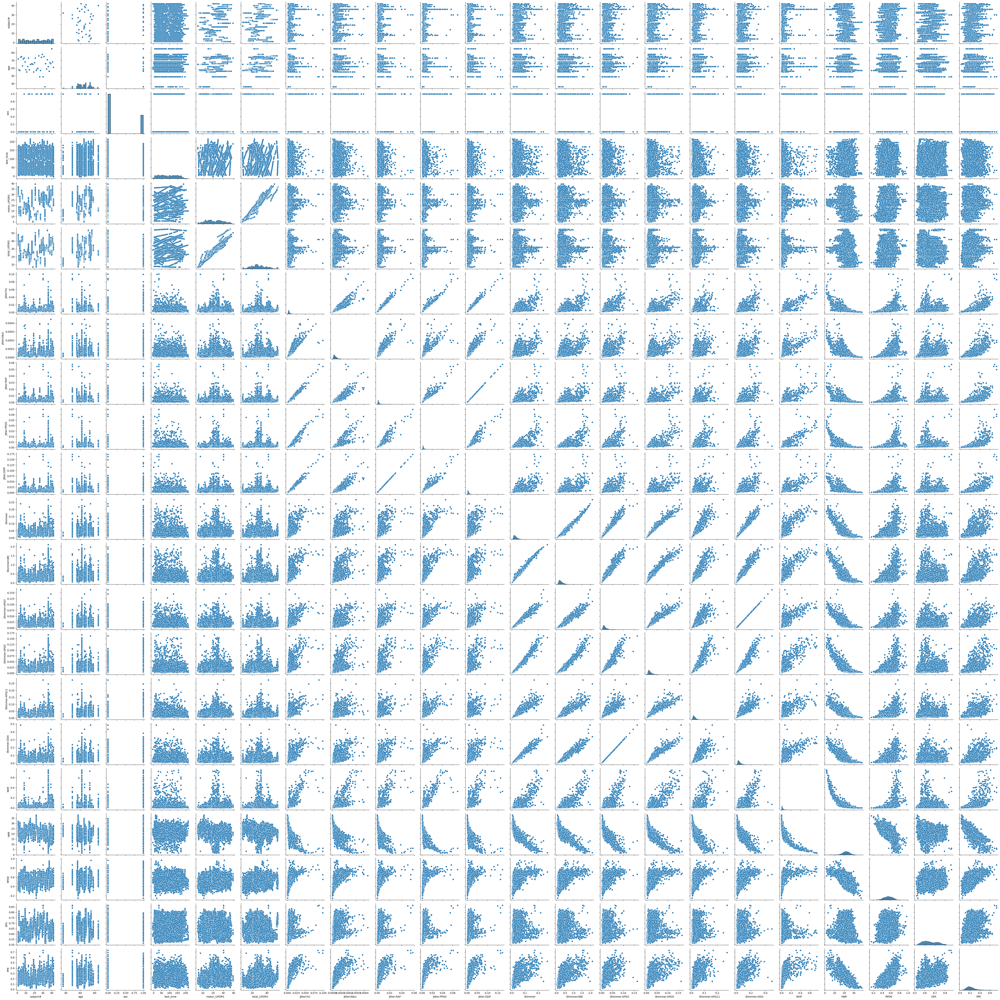

In [183]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.pairplot(df)
plt.show()

### 2.3 Hist of target

Text(0.5, 1.0, 'motors_UPDRS')

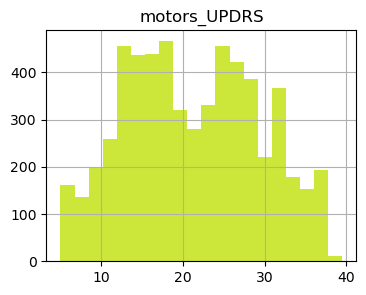

In [184]:
plt.figure(figsize=(4,3))
df['motor_UPDRS'].hist(bins = 20,color='#cce639')
plt.title('motors_UPDRS')

Text(0.5, 1.0, 'total_UPDRS')

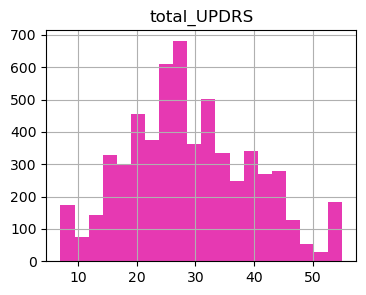

In [185]:
plt.figure(figsize=(4,3))
df['total_UPDRS'].hist(bins = 20,color='#e639b2')
plt.title('total_UPDRS')

### 2.4 Heatmap of correlation matirix

Text(0.5, 1.0, 'Heatmap')

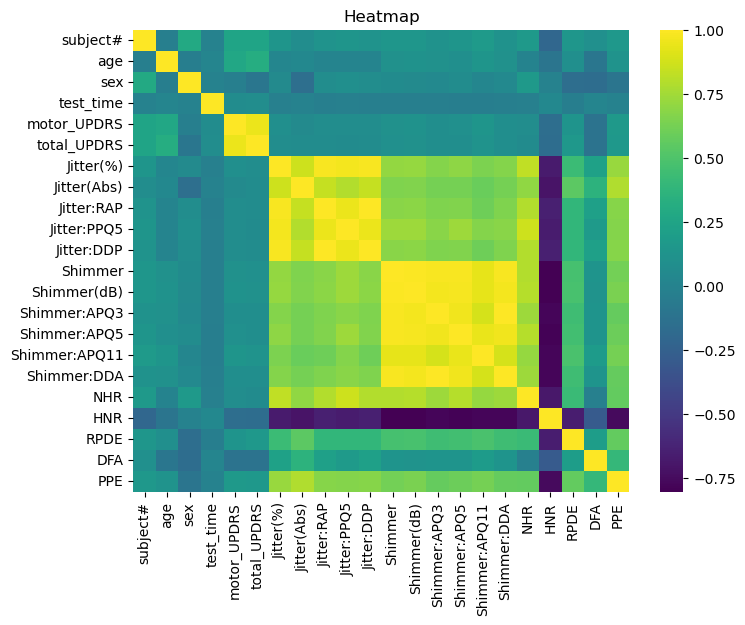

In [186]:
plt.figure(figsize=(8,6))
sns.heatmap(df.corr(), cmap='viridis')
plt.title('Heatmap')

### 2.5 Pie Chart of Gender

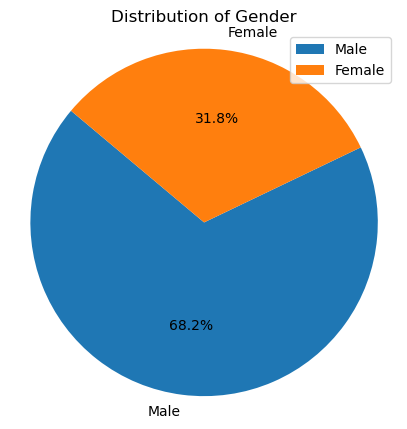

In [187]:
sex_counts = df['sex'].value_counts()
plt.figure(figsize=(5, 5))
plt.pie(sex_counts, labels=['Male', 'Female'], autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Gender')
plt.axis('equal')  
plt.legend()
plt.show()

### 2.6 Pie Chart of gender distribution

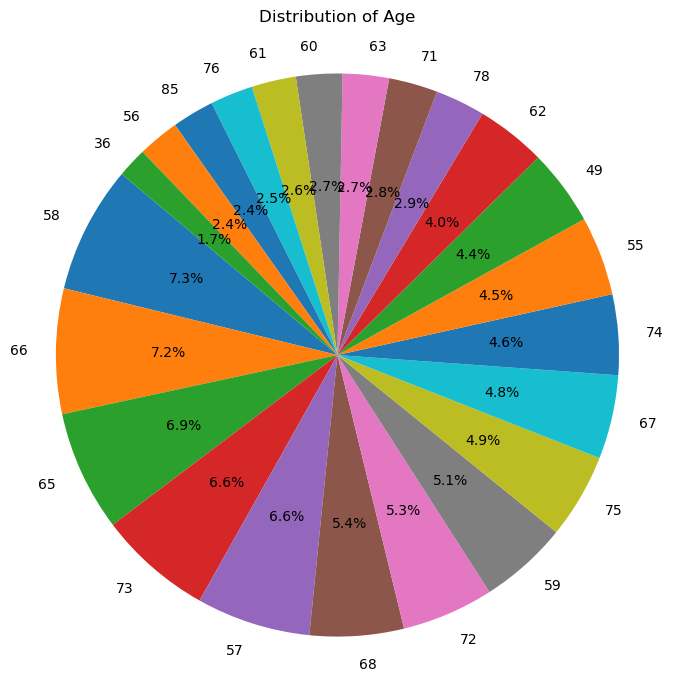

In [188]:
age_counts = df['age'].value_counts()
plt.figure(figsize=(8, 8)) 
plt.pie(age_counts, labels = age_counts.index, autopct = '%1.1f%%', startangle=140)
plt.title('Distribution of Age\n')
plt.axis('equal')
plt.show()

### 2.7 Violin plot: Sex Vs motor_UPDRS

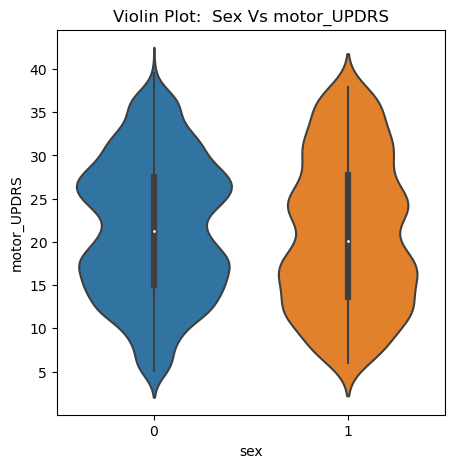

In [189]:
import seaborn as sns
import matplotlib.pyplot as plt

data = sns.load_dataset("tips")
plt.figure(figsize=(5, 5))
sns.violinplot(x="sex", y="motor_UPDRS", data=df)
plt.title('Violin Plot:  Sex Vs motor_UPDRS')
plt.show()

### 2.7 Violin plot: Age Vs motor_UPDRS

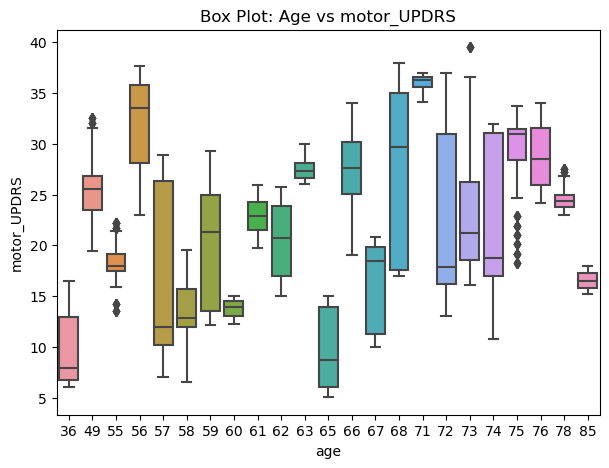

In [190]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 5))
sns.boxplot(x = "age", y = "motor_UPDRS", data = df)
plt.title('Box Plot: Age vs motor_UPDRS')
plt.show()

## 3. Data Preporcessing

In [191]:
df.head(5)

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,...,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,...,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,...,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,...,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,...,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361


### 3.1 X and y values

<pre>Target variable : motor_UPDRS
Droping subject, motor_updrs, total_updrs 
</pre>

In [192]:
X = df.drop(columns = ['subject#','motor_UPDRS', 'total_UPDRS'])
y = df['motor_UPDRS']

### 3.2 Train_Test Split

In [193]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [194]:
X_train.head()
X_train.shape

(4700, 19)

### 3.3 Standardization 

In [195]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Machine Learning Models

<p>
 
</p>

## 4.1 Linear Regression

### Training the Model

In [196]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

model.fit(X_train_scaled, y_train)

LinearRegression()

### Model Prediction

In [197]:
y_test_pred = model.predict(X_test_scaled)
y_train_pred = model.predict(X_train_scaled)

### Evaluating the model

In [198]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

R2_score_train = r2_score(y_train,  y_train_pred)
R2_score_test = r2_score(y_test, y_test_pred)

train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_train, y_train_pred)

In [199]:
print("Train MSE LinearRegression:", train_mse)
print("Test MSE LinearRegression:",  test_mse)

print("R2 Score Train LinearRegression:", R2_score_train)
print("R2 Score Test LinearRegression:", R2_score_test)

print("Train MAE LinearRegression:", train_mae)
print("Test MAE LinearRegression:",  test_mae)

Train MSE LinearRegression: 55.732264308118886
Test MSE LinearRegression: 56.01419722157733
R2 Score Train LinearRegression: 0.1635375330218255
R2 Score Test LinearRegression: 0.12243652571441144
Train MAE LinearRegression: 6.306060271125649
Test MAE LinearRegression: 6.306060271125649


### Ploting results

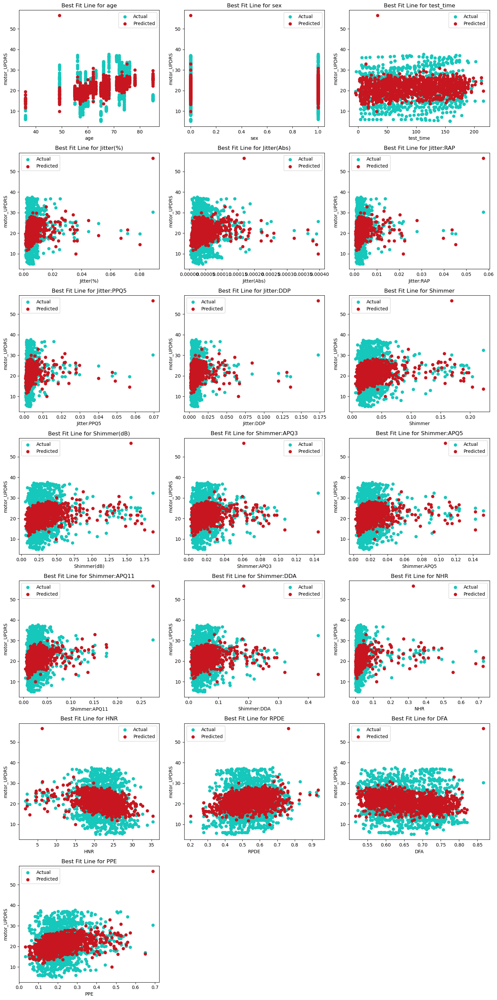

In [200]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(7, 3, figsize=(15, 30)) 
axes = axes.ravel()

for i, col in enumerate(X_train.columns):
    axes[i].scatter(X_test[col], y_test, color='#16c7bb', label='Actual')
    axes[i].scatter(X_test[col], y_test_pred, color='#c7161f', label='Predicted')
    
    axes[i].set_title(f'Best Fit Line for {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('motor_UPDRS') 
    axes[i].legend()

for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## 4.2 Support Vector Regressor

### Training the model with Hyper-Paramerter tuning using Grid Search

In [201]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR


param_grid = {
    'kernel': ['rbf'],
    'gamma': [ 0.3, 0.4],  
    'C': [5.0, 10.0,25]       
}


svm_regressor = SVR()

grid_search = GridSearchCV(estimator = svm_regressor, param_grid=param_grid, cv = 5, scoring='neg_mean_squared_error')

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

print("Best Parameters:", best_params)

Best Parameters: {'C': 25, 'gamma': 0.3, 'kernel': 'rbf'}


### Model Prediction

In [202]:
y_train_pred = best_estimator.predict(X_train)
y_test_pred = best_estimator.predict(X_test)

### Evaluating the model

In [203]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error


train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

R2_score_train = r2_score(y_train,  y_train_pred)
R2_score_test = r2_score(y_test, y_test_pred)

train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_train, y_train_pred)


In [204]:
print("Train MSE SVM:", train_mse)
print("Test MSE SVM:",  test_mse)

print("R2 Score Train SVM:", R2_score_train)
print("R2 Score Test SVM:", R2_score_test)

print("Train MAE SVM:", train_mae)
print("Test MAE SVM:",  test_mae)

Train MSE SVM: 0.7984704300104782
Test MSE SVM: 13.288623266939107
R2 Score Train SVM: 0.9880160880956995
R2 Score Test SVM: 0.7918097378691843
Train MAE SVM: 0.22024089728979943
Test MAE SVM: 0.22024089728979943


### Ploting the results

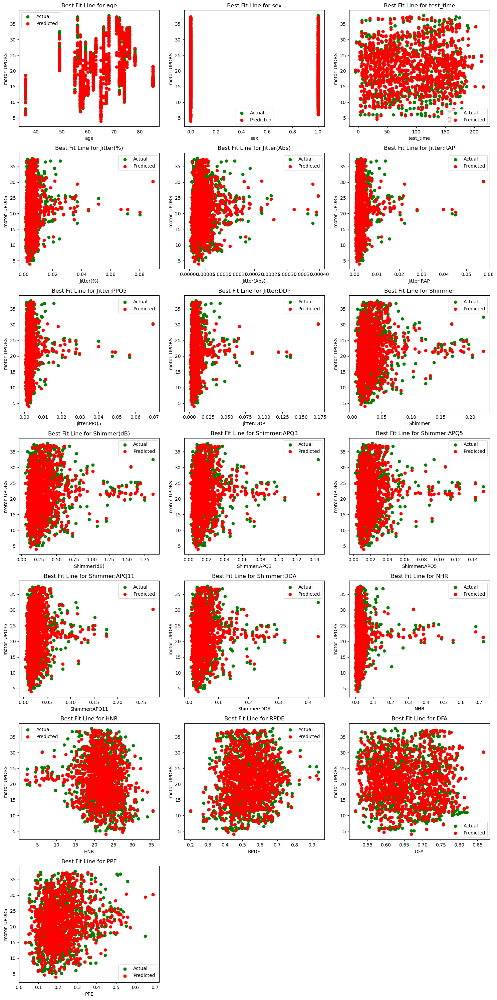

In [205]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(7, 3, figsize=(15, 30)) 
axes = axes.ravel()

for i, col in enumerate(X_train.columns):
    axes[i].scatter(X_test[col], y_test, color='green', label='Actual')
    axes[i].scatter(X_test[col], y_test_pred, color='red', label='Predicted')
    
    axes[i].set_title(f'Best Fit Line for {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('motor_UPDRS') 
    axes[i].legend()

for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## 4.3 Decision Tree 

### Training the model with Hyper-Paramerter tuning using Grid Search

In [206]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error


param_grid = {
    'max_depth': [3, 5, 7, 10, 15],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4, 6, 8]
}

dt_regressor = DecisionTreeRegressor(random_state=42)
grid_search = GridSearchCV(estimator = dt_regressor, param_grid = param_grid, cv = 5, scoring = 'neg_mean_squared_error')


grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_


### Model Prediction

In [207]:
y_train_pred = best_estimator.predict(X_train_scaled)
y_test_pred = best_estimator.predict(X_test_scaled)

### Evaluating the Model

In [208]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error


train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

R2_score_train = r2_score(y_train,  y_train_pred)
R2_score_test = r2_score(y_test, y_test_pred)

train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_train, y_train_pred)

In [209]:
print("Train MSE DecisionTree:", train_mse)
print("Test MSE DecisionTree:",  test_mse)

print("R2 Score Train DecisionTree:", R2_score_train)
print("R2 Score Test DecisionTree:", R2_score_test)

print("Train MAE DecisionTree:", train_mae)
print("Test MAE DecisionTree:",  test_mae)

print("Best Parameters:", best_params)

Train MSE DecisionTree: 0.9887422520610514
Test MSE DecisionTree: 5.306450593560369
R2 Score Train DecisionTree: 0.9851603771418262
R2 Score Test DecisionTree: 0.9168648762279177
Train MAE DecisionTree: 0.3996614746801549
Test MAE DecisionTree: 0.3996614746801549
Best Parameters: {'max_depth': 15, 'min_samples_leaf': 2, 'min_samples_split': 10}


### ploting the results

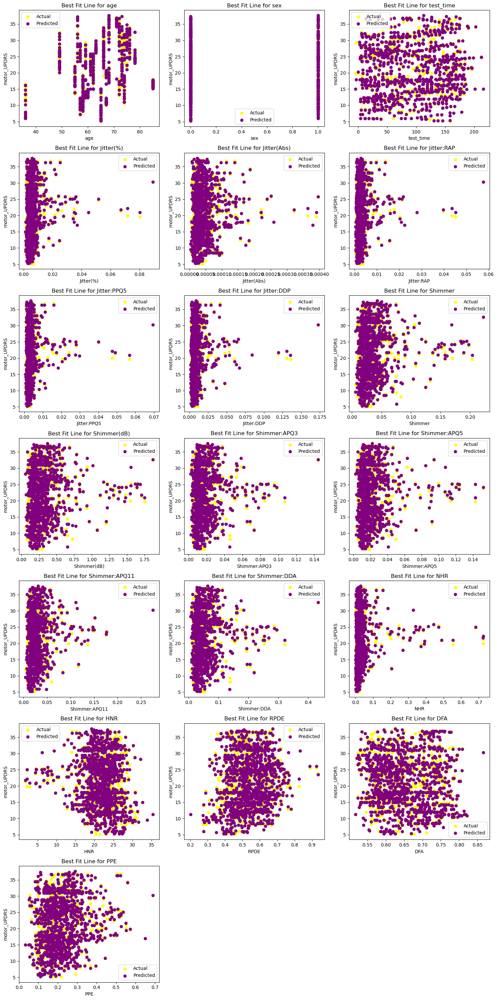

In [210]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(7, 3, figsize=(15, 30)) 
axes = axes.ravel()

for i, col in enumerate(X_train.columns):
    axes[i].scatter(X_test[col], y_test, color='yellow', label='Actual')
    axes[i].scatter(X_test[col], y_test_pred, color='purple', label='Predicted')
    
    axes[i].set_title(f'Best Fit Line for {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('motor_UPDRS') 
    axes[i].legend()

for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


## 4.4 GradientBoost 

### Training the model without using Hyper-Parameter tuning

In [211]:
from sklearn.ensemble import GradientBoostingRegressor
gradient_boost_model = GradientBoostingRegressor(n_estimators = 100, learning_rate = 0.1, max_depth = 7, random_state = 42)
gradient_boost_model.fit(X_train_scaled, y_train)

GradientBoostingRegressor(max_depth=7, random_state=42)

### Model Prediction

In [212]:
y_train_pred = gradient_boost_model.predict(X_train_scaled)
y_test_pred = gradient_boost_model.predict(X_test_scaled)

### Evaluating the Model

In [213]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error


train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

R2_score_train = r2_score(y_train,  y_train_pred)
R2_score_test = r2_score(y_test, y_test_pred)

train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_train, y_train_pred)

In [214]:
print("Train MSE GradientBoost:", train_mse)
print("Test MSE GradientBoost:",  test_mse)

print("R2 Score Train GradientBoost:", R2_score_train)
print("R2 Score Test GradientBoost:", R2_score_test)

print("Train MAE GradientBoost:", train_mae)
print("Test MAE GradientBoost:",  test_mae)

Train MSE GradientBoost: 0.3678907403736349
Test MSE GradientBoost: 1.8467804622491724
R2 Score Train GradientBoost: 0.9944784802826228
R2 Score Test GradientBoost: 0.971066851636145
Train MAE GradientBoost: 0.4184999384429958
Test MAE GradientBoost: 0.4184999384429958


### ploting the results

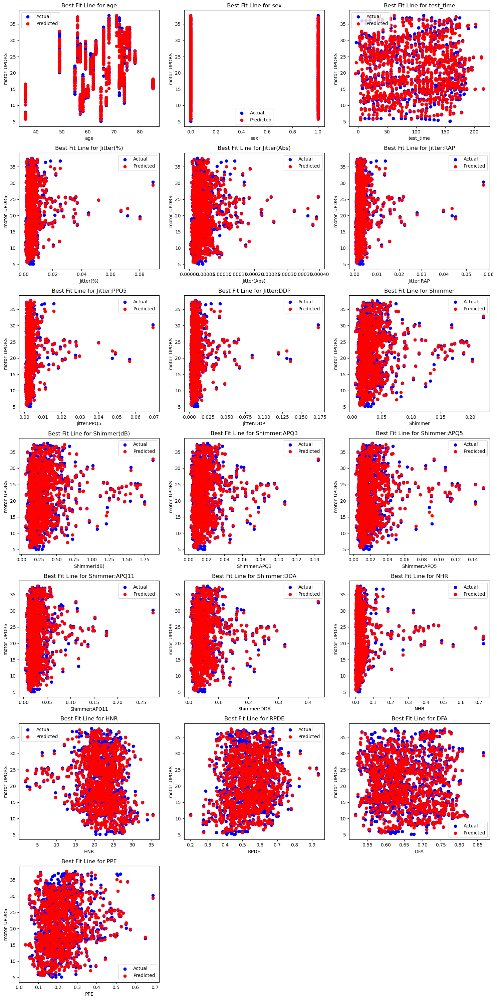

In [215]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(7, 3, figsize=(15, 30)) 
axes = axes.ravel()

for i, col in enumerate(X_train.columns):
    axes[i].scatter(X_test[col], y_test, color='blue', label='Actual')
    axes[i].scatter(X_test[col], y_test_pred, color='red', label='Predicted')
    
    axes[i].set_title(f'Best Fit Line for {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('motor_UPDRS') 
    axes[i].legend()

for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


## 4.5 AdaBoost 

### Training the model

In [216]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

adaboost_model = AdaBoostRegressor(base_estimator = DecisionTreeRegressor(max_depth = 10), n_estimators = 100, random_state = 42)
adaboost_model.fit(X_train_scaled, y_train)

C:\Users\Sumit\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=10),
                  n_estimators=100, random_state=42)

### Model Prediction

In [217]:
y_train_pred = adaboost_model.predict(X_train_scaled)
y_test_pred =  adaboost_model.predict(X_test_scaled)

### Evaluating the Model

In [218]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error


train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

R2_score_train = r2_score(y_train,  y_train_pred)
R2_score_test = r2_score(y_test, y_test_pred)

train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_train, y_train_pred)

In [219]:
print("Train MSE adaboost:", train_mse)
print("Test MSE adaboost:",  test_mse)

print("R2 Score Train adaboost:", R2_score_train)
print("R2 Score Test adaboost:", R2_score_test)

print("Train MAE adaboost:", train_mae)
print("Test MAE adaboost:",  test_mae)

Train MSE adaboost: 0.15577547636826256
Test MSE adaboost: 0.7538382417419265
R2 Score Train adaboost: 0.9976620304077846
R2 Score Test adaboost: 0.9881897636798131
Train MAE adaboost: 0.2403665238584856
Test MAE adaboost: 0.2403665238584856


### ploting the results

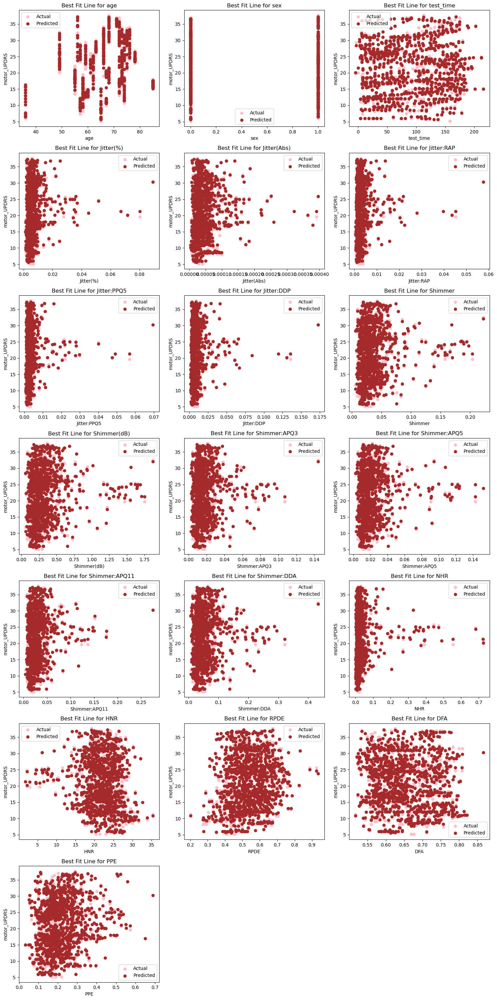

In [220]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(7, 3, figsize=(15, 30)) 
axes = axes.ravel()

for i, col in enumerate(X_train.columns):
    axes[i].scatter(X_test[col], y_test, color='pink', label='Actual')
    axes[i].scatter(X_test[col], y_test_pred, color='brown', label='Predicted')
    
    axes[i].set_title(f'Best Fit Line for {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('motor_UPDRS') 
    axes[i].legend()

for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


# 5. Using the Tensorflow for reducing the MSE Error

In [221]:
X = df.drop(columns = ['motor_UPDRS', 'total_UPDRS'])
y = df['motor_UPDRS']


from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [222]:
import tensorflow as tf

input_size = 20
hidden1_size = 500
hidden2_size = 250
hidden3_size = 100
hidden4_size = 50
output_size = 1

model = tf.keras.Sequential([
    tf.keras.layers.Dense(hidden1_size, input_shape=(input_size,), activation='relu'),
    tf.keras.layers.Dense(hidden2_size, activation='relu'),
    tf.keras.layers.Dense(hidden3_size, activation='relu'),
    tf.keras.layers.Dense(hidden4_size, activation='relu'),
    tf.keras.layers.Dense(output_size)
])

optimizer = tf.keras.optimizers.SGD(learning_rate=0.001)
model.compile(optimizer=optimizer, 
              loss='mean_squared_error')

history = model.fit(X_train_scaled, y_train, epochs = 150, batch_size=32, validation_split=0.2)

loss = model.evaluate(X_test_scaled, y_test)
print("Test Loss:", loss)

Epoch 1/150
118/118 [==============================] - 2s 8ms/step - loss: 94.2773 - val_loss: 47.4937
Epoch 2/150
118/118 [==============================] - 1s 6ms/step - loss: 40.9121 - val_loss: 30.7966
Epoch 3/150
118/118 [==============================] - 1s 6ms/step - loss: 29.1585 - val_loss: 45.4768
Epoch 4/150
118/118 [==============================] - 1s 5ms/step - loss: 21.6541 - val_loss: 15.1826
Epoch 5/150
118/118 [==============================] - 1s 5ms/step - loss: 17.9602 - val_loss: 27.3408
Epoch 6/150
118/118 [==============================] - 1s 5ms/step - loss: 15.9129 - val_loss: 12.0454
Epoch 7/150
118/118 [==============================] - 1s 6ms/step - loss: 14.7929 - val_loss: 10.7270
Epoch 8/150
118/118 [==============================] - 1s 6ms/step - loss: 11.6875 - val_loss: 8.9848
Epoch 9/150
118/118 [==============================] - 1s 5ms/step - loss: 9.5848 - val_loss: 9.9344
Epoch 10/150
118/118 [==============================] - 1s 5ms/step - loss: 

In [223]:
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

37/37 [==============================] - 0s 2ms/step


In [224]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error


train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

R2_score_train = r2_score(y_train,  y_train_pred)
R2_score_test = r2_score(y_test, y_test_pred)

train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_train, y_train_pred)

In [225]:
print("Train MSE Tensorflow:", train_mse)
print("Test MSE Tensorflow:",  test_mse)

print("R2 Score Train Tensorflow:", R2_score_train)
print("R2 Score Test Tensorflow:", R2_score_test)

print("Train MAE Tensorflow:", train_mae)
print("Test MAE Tensorflow:",  test_mae)

Train MSE Tensorflow: 0.48640285805538497
Test MSE Tensorflow: 1.3626042560304006
R2 Score Train Tensorflow: 0.9926997810039637
R2 Score Test Tensorflow: 0.9786523455782431
Train MAE Tensorflow: 0.3922922554491733
Test MAE Tensorflow: 0.3922922554491733


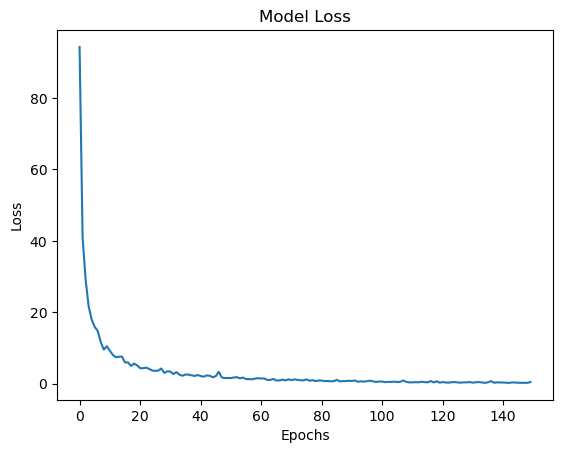

In [226]:
plt.plot(history.history['loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

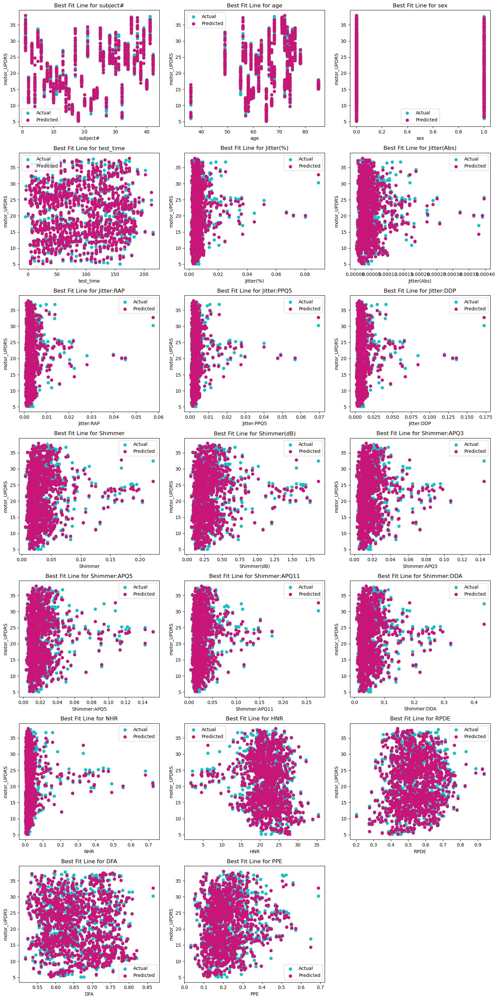

In [227]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(7, 3, figsize=(15, 30)) 
axes = axes.ravel()

for i, col in enumerate(X_train.columns):
    axes[i].scatter(X_test[col], y_test, color='#16c1c7', label='Actual')
    axes[i].scatter(X_test[col], y_test_pred, color='#c71677', label='Predicted')
    
    axes[i].set_title(f'Best Fit Line for {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('motor_UPDRS') 
    axes[i].legend()

for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()
